# 1. Импорт библиотек

In [1]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:128"
import random
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF

# Автоматический выбор лучшего доступного ускорителя
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"✅ Вычисления на NVIDIA GPU: {torch.cuda.get_device_name(0)}")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    print("✅ Вычисления на Apple Silicon GPU (MPS)")
else:
    device = torch.device("cpu")
    print("⚙️ Вычисления на CPU")

print("✅ Все библиотеки успешно импортированы!")

⚙️ Вычисления на CPU
✅ Все библиотеки успешно импортированы!


# МОДУЛЬ 1: Чистая функция нарезки (Slicer)

In [2]:
def slice_image_to_patches(image_or_path, patch_size=512, overlap_ratio=0.2):
    """
    ОТВЕТСТВЕННОСТЬ: Только геометрическая нарезка снимка.
    Возвращает:
      - patches: numpy массив (N, patch_size, patch_size)
      - coords: список координат (y, x)
      - orig_shape: размеры (H, W)
    """
    if isinstance(image_or_path, str):
        img = tiff.imread(image_or_path).astype(np.float32)
    else:
        img = image_or_path.astype(np.float32)

    h, w = img.shape
    stride = int(patch_size * (1.0 - overlap_ratio))

    y_steps = list(range(0, h - patch_size + 1, stride))
    if y_steps[-1] != h - patch_size: y_steps.append(h - patch_size)

    x_steps = list(range(0, w - patch_size + 1, stride))
    if x_steps[-1] != w - patch_size: x_steps.append(w - patch_size)

    patches = []
    coords = []
    for y in y_steps:
        for x in x_steps:
            patches.append(img[y:y+patch_size, x:x+patch_size])
            coords.append((y, x))

    return np.array(patches), coords, (h, w)

print("✅ Модуль 1 (Нарезка) готов!")

✅ Модуль 1 (Нарезка) готов!


# МОДУЛЬ 2: Независимые функции аугментации (Transforms)

In [3]:
import random
import torch
import numpy as np
import torchvision.transforms.functional as TF

# --- 1. D4 + Random Crop (работает с каждым отдельным патчем) ---
def d4_crop_ct_augmentation(noisy_tensor, clean_tensor, crop_size=128):
    # А. Random Crop (вырезаем 256x256)
    _, h, w = noisy_tensor.shape
    if h > crop_size and w > crop_size:
        top = random.randint(0, h - crop_size)
        left = random.randint(0, w - crop_size)
        noisy_tensor = noisy_tensor[:, top:top+crop_size, left:left+crop_size]
        clean_tensor = clean_tensor[:, top:top+crop_size, left:left+crop_size]

    # Б. Отражения (Flips)
    if random.random() > 0.5:
        noisy_tensor = TF.hflip(noisy_tensor)
        clean_tensor = TF.hflip(clean_tensor)
    if random.random() > 0.5:
        noisy_tensor = TF.vflip(noisy_tensor)
        clean_tensor = TF.vflip(clean_tensor)

    # В. Повороты на 90 градусов
    k = random.randint(0, 3)
    if k > 0:
        noisy_tensor = torch.rot90(noisy_tensor, k, dims=[1, 2])
        clean_tensor = torch.rot90(clean_tensor, k, dims=[1, 2])

    return noisy_tensor, clean_tensor


# МОДУЛЬ 3: Оркестратор датасета (CTModularDataset)

In [4]:
import os
import re
import numpy as np
import tifffile as tiff
import torch
from torch.utils.data import Dataset, DataLoader

# 1. Функция извлечения номера файла
def get_file_number(filename):
    """Извлекает числовой номер из имени файла (например, 'rec_00440.tif' -> 440)"""
    nums = re.findall(r'\d+', filename)
    return int(nums[-1]) if nums else -1


class CTModularDataset(Dataset):
    def __init__(
        self, 
        noisy_dir, 
        clean_dir, 
        file_list=None,        # 🔥 ПЕРЕДАЕМ ГОТОВЫЙ СПИСОК (train_files или val_files)
        patch_size=512, 
        overlap_ratio=0.2, 
        transform_fn=None
    ):
        self.patch_size = patch_size
        self.transform_fn = transform_fn
        
        # Если список файлов передан напрямую (train или val) — берем его
        if file_list is not None:
            self.common_names = file_list
        else:
            noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.lower().endswith(('.tif', '.tiff'))])
            clean_files = sorted([f for f in os.listdir(clean_dir) if f.lower().endswith(('.tif', '.tiff'))])
            self.common_names = sorted(list(set(noisy_files) & set(clean_files)))

        self.noisy_paths = [os.path.join(noisy_dir, f) for f in self.common_names]
        self.clean_paths = [os.path.join(clean_dir, f) for f in self.common_names]

        # 2. Построение координатной сетки
        _, self.base_coords, _ = slice_image_to_patches(self.noisy_paths[0], patch_size, overlap_ratio)

        # 3. Строим точный индекс только для переданных файлов
        self.patch_index = [
            (img_idx, y, x) 
            for img_idx in range(len(self.common_names)) 
            for y, x in self.base_coords
        ]

        print(f"📁 Загружено пар снимков: {len(self.common_names)} (от {self.common_names[0]} до {self.common_names[-1]})")
        print(f"🎉 Сформирован индекс: {len(self.patch_index)} патчей {patch_size}x{patch_size}")
        print(f"🔄 Стратегия аугментации: {transform_fn.__name__ if transform_fn else 'Без аугментации'}\n")

    def __len__(self):
        return len(self.patch_index)

    def __getitem__(self, idx):
        img_idx, y, x = self.patch_index[idx]
        p = self.patch_size

        n_img = tiff.imread(self.noisy_paths[img_idx]).astype(np.float32)
        c_img = tiff.imread(self.clean_paths[img_idx]).astype(np.float32)

        n_patch = n_img[y:y+p, x:x+p]
        c_patch = c_img[y:y+p, x:x+p]

        # Нормализация [0, 1]
        n_patch = (n_patch - np.min(n_patch)) / (np.max(n_patch) - np.min(n_patch) + 1e-8)
        c_patch = (c_patch - np.min(c_patch)) / (np.max(c_patch) - np.min(c_patch) + 1e-8)

        n_tensor = torch.from_numpy(n_patch).unsqueeze(0).float()
        c_tensor = torch.from_numpy(c_patch).unsqueeze(0).float()

        if self.transform_fn is not None:
            n_tensor, c_tensor = self.transform_fn(n_tensor, c_tensor)

        return n_tensor, c_tensor

    def _load_and_cache_file(self, img_idx):
        """Загружает весь файл, нарезает все патчи и сохраняет в self._cache"""
        noisy_path = self.noisy_paths[img_idx]
        clean_path = self.clean_paths[img_idx]

        n_img = tiff.imread(noisy_path).astype(np.float32)
        c_img = tiff.imread(clean_path).astype(np.float32)

        p = self.patch_size
        cache = {}
        for y, x in self.base_coords:
            n_patch = n_img[y:y+p, x:x+p]
            c_patch = c_img[y:y+p, x:x+p]
            cache[(y, x)] = (n_patch, c_patch)

        self._cache = cache

# Инициализация

In [5]:
# # ==============================================================================
# # ⚙️ ФИЛЬТРАЦИЯ + ВЫБОРКА С ШАГОМ (КАЖДЫЙ 5-Й СНИМОК)
# # ==============================================================================
# import re
# import os

# NOISY_DIR = "filestore/filestorage/V_beton30_angle05"
# CLEAN_DIR = "filestore/filestorage/V_beton30_angle005"

# # 🔥 УКАЖИТЕ ШАГ ВЫБОРКИ (5 = брать каждый 5-й снимок):
# STEP = 5  

# def get_file_number(filename):
#     nums = re.findall(r'\d+', filename)
#     return int(nums[-1]) if nums else -1

# # 1. Поиск всех файлов
# noisy_files = sorted([f for f in os.listdir(NOISY_DIR) if f.lower().endswith(('.tif', '.tiff'))])
# clean_files = sorted([f for f in os.listdir(CLEAN_DIR) if f.lower().endswith(('.tif', '.tiff'))])
# all_pairs = sorted(list(set(noisy_files) & set(clean_files)))

# # 2. Исключаем краевые срезы [0..400] и [2430..2816]
# clean_range_pairs = [
#     f for f in all_pairs 
#     if not (0 <= get_file_number(f) <= 400 or 2430 <= get_file_number(f) <= 2816)
# ]

# # ==============================================================================
# # 🔥 ШАГ 3: БЕРЕМ КАЖДЫЙ 5-Й СНИМОК ЧЕРЕЗ СРЕЗ [::STEP]
# # ==============================================================================
# subsampled_pairs = clean_range_pairs[::STEP]

# print(f"📁 Всего файлов до фильтрации: {len(all_pairs)} пар")
# print(f"✅ В полезном диапазоне (401..2429): {len(clean_range_pairs)} пар")
# print(f"🎯 Отобрано с шагом {STEP} (каждый 5-й снимок): {len(subsampled_pairs)} пар снимков!\n")

# # 4. ДЕЛИМ 406 СНИМКОВ: 80% Train, 20% Val
# train_split = int(0.8 * len(subsampled_pairs))
# train_files = subsampled_pairs[:train_split]  # 324 снимка
# val_files = subsampled_pairs[train_split:]    # 82 снимка

# print(f"📊 РАСПРЕДЕЛЕНИЕ ДАТАСЕТА:")
# print(f"   └── Обучающая выборка (Train 80%): {len(train_files)} пар (от {train_files[0]} до {train_files[-1]})")
# print(f"   └── Валидация (Val/Test 20%):      {len(val_files)} пар (от {val_files[0]} до {val_files[-1]})\n")

# # 5. Инициализируем датасеты
# train_dataset = CTModularDataset(
#     noisy_dir=NOISY_DIR,
#     clean_dir=CLEAN_DIR,
#     file_list=train_files,  # 324 снимка
#     patch_size=512,
#     overlap_ratio=0.2,
#     transform_fn=d4_crop_ct_augmentation
# )

# val_dataset = CTModularDataset(
#     noisy_dir=NOISY_DIR,
#     clean_dir=CLEAN_DIR,
#     file_list=val_files,    # 82 снимка
#     patch_size=512,
#     overlap_ratio=0.2,
#     transform_fn=None
# )

# # 6. Создаем DataLoader'ы
# train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
# val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

# print(f"🎉 ИТОГ: Train = {len(train_dataset)} патчей | Val = {len(val_dataset)} патчей (0% пересечения)")

In [6]:
# # ==============================================================================
# # ⚙️ ПРАВИЛЬНОЕ 3-УРОВНЕВОЕ РАЗДЕЛЕНИЕ: TRAIN (70%) / VAL (15%) / TEST (15%)
# # ==============================================================================
# import os
# import re
# import random
# from torch.utils.data import DataLoader

# NOISY_DIR = "filestore/filestorage/V_beton30_angle05"
# CLEAN_DIR = "filestore/filestorage/V_beton30_angle005"
# STEP = 5  # каждый 5-й снимок

# def get_file_number(filename):
#     nums = re.findall(r'\d+', filename)
#     return int(nums[-1]) if nums else -1

# # 1. Поиск всех пар файлов
# noisy_files = sorted([f for f in os.listdir(NOISY_DIR) if f.lower().endswith(('.tif', '.tiff'))])
# clean_files = sorted([f for f in os.listdir(CLEAN_DIR) if f.lower().endswith(('.tif', '.tiff'))])
# all_pairs = sorted(list(set(noisy_files) & set(clean_files)))

# # 2. Фильтрация краев [0..400] и [2430..2816] + шаг [::STEP]
# clean_range_pairs = [
#     f for f in all_pairs 
#     if not (0 <= get_file_number(f) <= 400 or 2430 <= get_file_number(f) <= 2816)
# ]
# subsampled_pairs = clean_range_pairs[::STEP]

# # 3. 🔥 СЛУЧАЙНОЕ, НО ВОСПРОИЗВОДИМОЕ ПЕРЕМЕШИВАНИЕ (Фиксированный seed=42)
# random.seed(42)
# shuffled_pairs = subsampled_pairs.copy()
# random.shuffle(shuffled_pairs)

# # 4. РАСЧЕТ ДОЛЕЙ: 70% Train / 15% Val / 15% Test
# n_total = len(shuffled_pairs)
# n_train = int(0.70 * n_total)  # 284 снимка
# n_val   = int(0.15 * n_total)  # 61 снимок
# n_test  = n_total - n_train - n_val  # 61 снимок

# train_files = sorted(shuffled_pairs[:n_train])
# val_files   = sorted(shuffled_pairs[n_train:n_train + n_val])
# test_files  = sorted(shuffled_pairs[n_train + n_val:])

# print("=" * 70)
# print(f"📊 СТАТИСТИКА 3-УРОВНЕВОГО РАЗДЕЛЕНИЯ (Всего {n_total} пар снимков):")
# print(f"   🟢 Обучение (Train 70%):     {len(train_files)} пар ({len(train_files)*64:,} патчей) — с D4 + Crop")
# print(f"   🟡 Валидация (Val 15%):      {len(val_files)} пар ({len(val_files)*64:,} патчей) — для чекпоинтов")
# print(f"   🔴 Тестирование (Test 15%):  {len(test_files)} пар ({len(test_files)*64:,} патчей) — НЕПРИКОСНОВЕННЫЙ ТЕСТ")
# print("=" * 70 + "\n")

# # 5. СОЗДАЕМ 3 НЕЗАВИСИМЫХ ДАТАСЕТА
# train_dataset = CTModularDataset(
#     noisy_dir=NOISY_DIR,
#     clean_dir=CLEAN_DIR,
#     file_list=train_files,
#     patch_size=512,
#     overlap_ratio=0.2,
#     transform_fn=d4_crop_ct_augmentation  # 🔥 Аугментация ВКЛЮЧЕНА
# )

# val_dataset = CTModularDataset(
#     noisy_dir=NOISY_DIR,
#     clean_dir=CLEAN_DIR,
#     file_list=val_files,
#     patch_size=512,
#     overlap_ratio=0.2,
#     transform_fn=None                      # 🔥 Без аугментации
# )

# test_dataset = CTModularDataset(
#     noisy_dir=NOISY_DIR,
#     clean_dir=CLEAN_DIR,
#     file_list=test_files,
#     patch_size=512,
#     overlap_ratio=0.2,
#     transform_fn=None                      # 🔥 Без аугментации (Hold-out Test)
# )

# # 6. СОЗДАЕМ 3 DATALOADER'А
# train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True,  num_workers=2)
# val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=2)
# test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=2)

# print(f"🎉 ИТОГ: Train={len(train_dataset)} | Val={len(val_dataset)} | Test={len(test_dataset)} (0% пересечений)")

In [10]:
# ==============================================================================
# ⚙️ РАЗДЕЛЕНИЕ НА TRAIN (80%) / VAL (10%) / TEST (10%)
# ==============================================================================
import os
import re
import random
from torch.utils.data import DataLoader

NOISY_DIR = "filestore/filestorage/V_beton30_angle05"
CLEAN_DIR = "filestore/filestorage/V_beton30_angle005"
STEP = 5  # каждый 5-й снимок

def get_file_number(filename):
    nums = re.findall(r'\d+', filename)
    return int(nums[-1]) if nums else -1

# 1. Поиск всех пар файлов
noisy_files = sorted([f for f in os.listdir(NOISY_DIR) if f.lower().endswith(('.tif', '.tiff'))])
clean_files = sorted([f for f in os.listdir(CLEAN_DIR) if f.lower().endswith(('.tif', '.tiff'))])
all_pairs = sorted(list(set(noisy_files) & set(clean_files)))

# 2. Фильтрация краев [0..400] и [2430..2816] + шаг [::STEP]
clean_range_pairs = [
    f for f in all_pairs 
    if not (0 <= get_file_number(f) <= 400 or 2430 <= get_file_number(f) <= 2816)
]
subsampled_pairs = clean_range_pairs[::STEP]

# 3. Случайное воспроизводимое перемешивание (seed=42)
random.seed(42)
shuffled_pairs = subsampled_pairs.copy()
random.shuffle(shuffled_pairs)

# ==============================================================================
# 🔥 РАСЧЕТ ДОЛЕЙ: 80% Train / 10% Val / 10% Test
# ==============================================================================
n_total = len(shuffled_pairs)          # 406 снимков
n_train = int(0.80 * n_total)          # 324 снимка (80%)
n_val   = int(0.10 * n_total)          # 40 снимков (10%)
n_test  = n_total - n_train - n_val    # 42 снимка (10%)

train_files = sorted(shuffled_pairs[:n_train])
val_files   = sorted(shuffled_pairs[n_train:n_train + n_val])
test_files  = sorted(shuffled_pairs[n_train + n_val:])

print("=" * 75)
print(f"📊 СТАТИСТИКА РАЗДЕЛЕНИЯ 80 / 10 / 10 (Всего {n_total} пар снимков):")
print(f"   🟢 Обучение (Train 80%):    {len(train_files)} пар ({len(train_files)*64:,} патчей) — с D4 + Crop")
print(f"   🟡 Валидация (Val 10%):     {len(val_files)} пар ({len(val_files)*64:,} патчей) — для чекпоинтов")
print(f"   🔴 Тестирование (Test 10%): {len(test_files)} пар ({len(test_files)*64:,} патчей) — НЕПРИКОСНОВЕННЫЙ ТЕСТ")
print("=" * 75 + "\n")

# 4. СОЗДАЕМ 3 НЕЗАВИСИМЫХ ДАТАСЕТА
train_dataset = CTModularDataset(
    noisy_dir=NOISY_DIR,
    clean_dir=CLEAN_DIR,
    file_list=train_files,
    patch_size=512,
    overlap_ratio=0.2,
    transform_fn=d4_crop_ct_augmentation  # с аугментацией
)

val_dataset = CTModularDataset(
    noisy_dir=NOISY_DIR,
    clean_dir=CLEAN_DIR,
    file_list=val_files,
    patch_size=512,
    overlap_ratio=0.2,
    transform_fn=None                      # без аугментации
)

test_dataset = CTModularDataset(
    noisy_dir=NOISY_DIR,
    clean_dir=CLEAN_DIR,
    file_list=test_files,
    patch_size=512,
    overlap_ratio=0.2,
    transform_fn=None                      # без аугментации (Hold-out)
)

# 5. СОЗДАЕМ DATALOADER'Ы
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=2)

print(f"🎉 ИТОГ: Train={len(train_dataset)} | Val={len(val_dataset)} | Test={len(test_dataset)} (0% пересечений)")

📊 СТАТИСТИКА РАЗДЕЛЕНИЯ 80 / 10 / 10 (Всего 406 пар снимков):
   🟢 Обучение (Train 80%):    324 пар (20,736 патчей) — с D4 + Crop
   🟡 Валидация (Val 10%):     40 пар (2,560 патчей) — для чекпоинтов
   🔴 Тестирование (Test 10%): 42 пар (2,688 патчей) — НЕПРИКОСНОВЕННЫЙ ТЕСТ

📁 Загружено пар снимков: 324 (от rec_00401.tif до rec_02426.tif)
🎉 Сформирован индекс: 20736 патчей 512x512
🔄 Стратегия аугментации: d4_crop_ct_augmentation

📁 Загружено пар снимков: 40 (от rec_00511.tif до rec_02386.tif)
🎉 Сформирован индекс: 2560 патчей 512x512
🔄 Стратегия аугментации: Без аугментации

📁 Загружено пар снимков: 42 (от rec_00416.tif до rec_02411.tif)
🎉 Сформирован индекс: 2688 патчей 512x512
🔄 Стратегия аугментации: Без аугментации

🎉 ИТОГ: Train=20736 | Val=2560 | Test=2688 (0% пересечений)


# SCUNet

In [28]:
import os
import sys
import subprocess
from pathlib import Path

import torch

SCUNET_DIR = Path("SCUNet")
SCUNET_MODEL_DIR = SCUNET_DIR / "model_zoo"
SCUNET_PRETRAINED_CKPTS = [
    "scunet_gray_15.pth",
    "scunet_gray_25.pth",
    "scunet_gray_50.pth",
]

if not SCUNET_DIR.exists():
    subprocess.run(["git", "clone", "https://github.com/cszn/SCUNet", str(SCUNET_DIR)], check=True)

subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q", "timm", "einops", "thop", "tifffile", "scikit-image"],
    check=True,
)

if not all((SCUNET_MODEL_DIR / name).exists() for name in SCUNET_PRETRAINED_CKPTS):
    subprocess.run(
        [
            sys.executable,
            "main_download_pretrained_models.py",
            "--models",
            "SCUNet",
            "--model_dir",
            "model_zoo",
        ],
        cwd=SCUNET_DIR,
        check=True,
    )

if str(SCUNET_DIR.resolve()) not in sys.path:
    sys.path.insert(0, str(SCUNET_DIR.resolve()))

from models.network_scunet import SCUNet

# Если хотите явно выбрать стартовые веса, задайте имя файла из model_zoo.
# Например: "scunet_gray_15.pth", "scunet_gray_25.pth" или "scunet_gray_50.pth".
SCUNET_START_CKPT = "scunet_gray_25.pth"

model = SCUNet(in_nc=1, config=[4, 4, 4, 4, 4, 4, 4], dim=64)
ckpt_path = SCUNET_MODEL_DIR / SCUNET_START_CKPT
if ckpt_path.exists():
    ckpt = torch.load(ckpt_path, map_location="cpu")
    model.load_state_dict(ckpt, strict=True)
    print(f"✅ Загружены стартовые веса SCUNet: {ckpt_path}")
else:
    print(f"⚠️ Стартовые веса SCUNet не найдены: {ckpt_path}. Модель будет обучаться с нуля.")

model = model.to(device)
print(f"✅ SCUNet инициализирован. Параметров: {sum(p.numel() for p in model.parameters()):,}")


[notice] A new release of pip is available: 23.0.1 -> 26.2.1
[notice] To update, run: python3 -m pip install --upgrade pip


Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Blo

# loss function 

In [29]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CharbonnierLoss(nn.Module):
    def __init__(self, eps=1e-3):
        super().__init__()
        self.eps2 = eps ** 2

    def forward(self, pred, target):
        return torch.mean(torch.sqrt((pred - target)**2 + self.eps2))


class EdgeLoss(nn.Module):
    """Градиенты Собеля по X и Y (штраф за смазанные края)"""
    def __init__(self):
        super().__init__()
        sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32).unsqueeze(0).unsqueeze(0)
        sobel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32).unsqueeze(0).unsqueeze(0)
        self.register_buffer('sobel_x', sobel_x)
        self.register_buffer('sobel_y', sobel_y)

    def forward(self, pred, target):
        pred_x = F.conv2d(pred, self.sobel_x.to(pred.device), padding=1)
        pred_y = F.conv2d(pred, self.sobel_y.to(pred.device), padding=1)
        target_x = F.conv2d(target, self.sobel_x.to(pred.device), padding=1)
        target_y = F.conv2d(target, self.sobel_y.to(pred.device), padding=1)
        return F.l1_loss(pred_x, target_x) + F.l1_loss(pred_y, target_y)


class FullHybridCTLoss(nn.Module):
    """
    Полный 3-уровневый лосс: Пространство (Charbonnier) + Градиенты (Edge) + Частоты (FFT)
    """
    def __init__(self, w_charb=1.0, w_edge=1.0):
        super().__init__()
        self.w_charb = w_charb
        self.w_edge = w_edge

        self.charb = CharbonnierLoss()
        self.edge = EdgeLoss()

    def forward(self, pred, target):
        l_charb = self.charb(pred, target)
        l_edge = self.edge(pred, target)

        return (self.w_charb * l_charb) + (self.w_edge * l_edge)

# Цикл обучения (Training Loop)

In [9]:
import os
import time
import torch.optim as optim
from tqdm.auto import tqdm

criterion = FullHybridCTLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

NUM_EPOCHS = 1000
use_amp = (device.type == 'cuda')
scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

best_val_loss = float('inf')  # Отслеживаем лучший результат на ВАЛИДАЦИИ
CHECKPOINT_DIR = "checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

BEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, "scunet_best_model.pth")
LAST_CHECKPOINT_PATH = os.path.join(CHECKPOINT_DIR, "scunet_last_checkpoint.pth")

print("=" * 80)
print(f"🚀 ЗАПУСК ОБУЧЕНИЯ С ВАЛИДАЦИЕЙ (Train: {len(train_dataset)} патчей, Val: {len(val_dataset)} патчей)")
print("=" * 80 + "\n")

for epoch in range(NUM_EPOCHS):
    start_time = time.time()

    # --------------------------------------------------------------------------
    # 1. ФАЗА ОБУЧЕНИЯ (TRAIN)
    # --------------------------------------------------------------------------
    model.train()
    train_running_loss = 0.0
    train_loop = tqdm(train_loader, desc=f"Эпоха [{epoch+1:02d}/{NUM_EPOCHS:02d}] TRAIN", unit="батч")

    for noisy_b, clean_b in train_loop:
        noisy_b = noisy_b.to(device, non_blocking=True)
        clean_b = clean_b.to(device, non_blocking=True)
        
        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=use_amp):
            preds = model(noisy_b)
            loss = criterion(preds, clean_b)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        train_running_loss += loss.item()
        train_loop.set_postfix(train_loss=f"{loss.item():.4f}")

    train_loss = train_running_loss / len(train_loader)

    # --------------------------------------------------------------------------
    # 2. ФАЗА ВАЛИДАЦИИ (VAL / TEST) - БЕЗ расчета градиентов
    # --------------------------------------------------------------------------
    model.eval()
    val_running_loss = 0.0

    with torch.no_grad():
        for noisy_b, clean_b in val_loader:
            noisy_b = noisy_b.to(device, non_blocking=True)
            clean_b = clean_b.to(device, non_blocking=True)

            with torch.cuda.amp.autocast(enabled=use_amp):
                preds = model(noisy_b)
                loss = criterion(preds, clean_b)

            val_running_loss += loss.item()

    val_loss = val_running_loss / len(val_loader)
    epoch_time = time.time() - start_time

    print(f"⏱️ Эпоха {epoch+1:02d} ({epoch_time:.1f}с) | Train Loss: {train_loss:.5f} | Val Loss: {val_loss:.5f}")

    # --------------------------------------------------------------------------
    # 3. СОХРАНЕНИЕ ЛУЧШЕЙ МОДЕЛИ ПО VAL LOSS
    # --------------------------------------------------------------------------
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"   ⭐ [НОВЫЙ РЕКОРД НА VAL] Val Loss = {best_val_loss:.5f} -> Сохранено в '{BEST_MODEL_PATH}'")

    # Сохраняем полный чекпоинт
    checkpoint = {
        'epoch': epoch + 1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'train_loss': train_loss,
        'val_loss': val_loss,
        'best_val_loss': best_val_loss
    }
    torch.save(checkpoint, LAST_CHECKPOINT_PATH)

print("\n" + "=" * 80)
print(f"🎉 ОБУЧЕНИЕ ЗАВЕРШЕНО! Лучший результат на незнакомых снимках (Val Loss): {best_val_loss:.5f}")
print("=" * 80)

🚀 ЗАПУСК ОБУЧЕНИЯ С ВАЛИДАЦИЕЙ (Train: 103872 патчей, Val: 25984 патчей)



Эпоха [01/1000] TRAIN:   0%|          | 0/6492 [00:15<?, ?батч/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 16.00 MiB (GPU 0; 14.75 GiB total capacity; 14.55 GiB already allocated; 14.31 MiB free; 14.59 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

/tmp/ipykernel_2674/3991439723.py:88: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/kernel/lib/python3.10/site-packages/ml_kernel/_vendor/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/kernel/lib/python3.10/site-packages/ml_kernel/_vendor/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


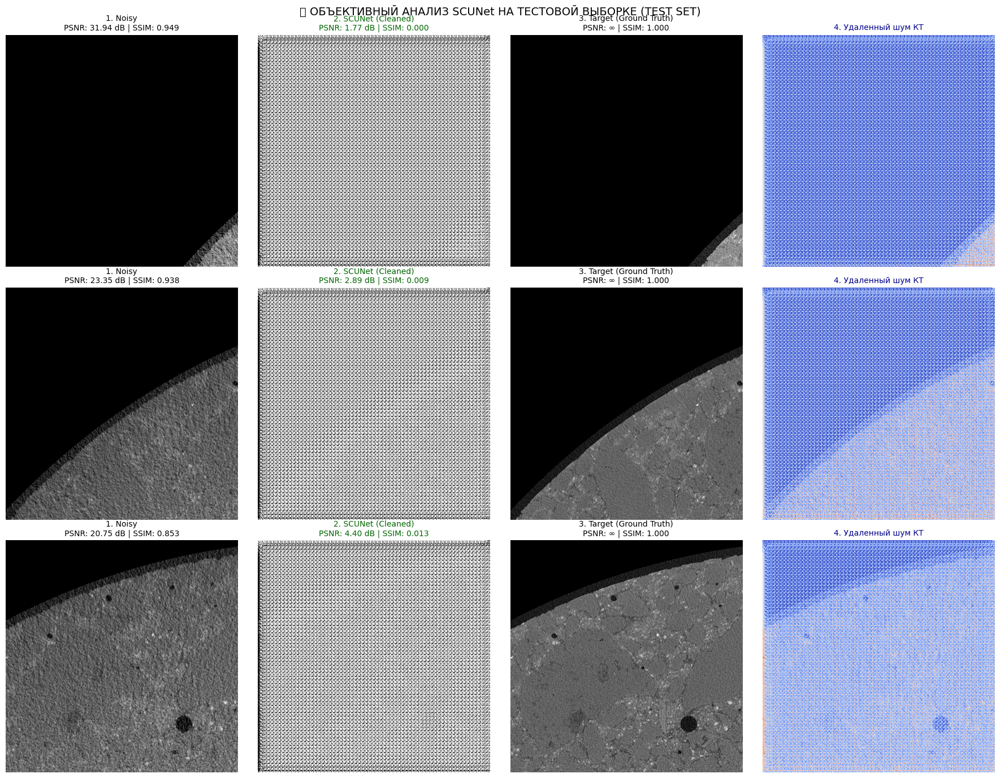

📈 ИТОГОВЫЙ ПРИРОСТ КАЧЕСТВА НА ТЕСТОВОЙ ВЫБОРКЕ:
• PSNR: было 25.35 dB ➔ стало 3.02 dB (Прирост: +-22.33 dB 🚀)
• SSIM: было 0.913   ➔ стало 0.007   (Прирост: +-0.906 🚀)


In [11]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import torch

# 1. Загружаем веса лучшей модели
BEST_MODEL_PATH = "checkpoints/scunet_best_model.pth"
if os.path.exists(BEST_MODEL_PATH):
    model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
    print(f"✅ Успешно загружены веса лучшей модели из: '{BEST_MODEL_PATH}'")
model.eval()

# 2. Функции расчета метрик
def calculate_psnr(pred, target):
    mse = np.mean((pred - target) ** 2)
    if mse == 0: return float('inf')
    return 20 * np.log10(1.0 / np.sqrt(mse))

def calculate_ssim(img1, img2):
    C1, C2 = 0.01**2, 0.03**2
    mu1, mu2 = img1.mean(), img2.mean()
    sigma1, sigma2 = img1.var(), img2.var()
    sigma12 = np.mean((img1 - mu1) * (img2 - mu2))
    return ((2 * mu1 * mu2 + C1) * (2 * sigma12 + C2)) / ((mu1**2 + mu2**2 + C1) * (sigma1 + sigma2 + C2))

# 3. Ищем 3 информативных патча из ТЕСТОВОЙ выборки (test_dataset)
selected_indices = []
for idx in range(len(test_dataset)):  # 🔥 ТЕСТОВЫЙ ДАТАСЕТ (42 снимка)
    img_idx, y, x = test_dataset.patch_index[idx]
    sample_clean = tiff.imread(test_dataset.clean_paths[img_idx])[y:y+512, x:x+512]
    
    if np.std(sample_clean) > 0.04:
        selected_indices.append(idx)
        if len(selected_indices) == 3:
            break

if len(selected_indices) < 3:
    selected_indices = [0, len(test_dataset) // 2, len(test_dataset) - 1]

# 4. Отрисовка 4 колонок
fig, axes = plt.subplots(3, 4, figsize=(18, 14))
psnr_noisy_l, psnr_pred_l = [], []
ssim_noisy_l, ssim_pred_l = [], []

for row, idx in enumerate(selected_indices):
    noisy_tensor, clean_tensor = test_dataset[idx]  # 🔥 ТЕСТОВЫЙ ДАТАСЕТ

    with torch.no_grad():
        input_b = noisy_tensor.unsqueeze(0).to(device)
        pred_tensor = model(input_b)

    noisy_np = noisy_tensor.squeeze().cpu().numpy()
    pred_np = np.clip(pred_tensor.squeeze().cpu().numpy(), 0.0, 1.0)
    clean_np = clean_tensor.squeeze().cpu().numpy()

    noise_extracted = noisy_np - pred_np

    p_noisy = calculate_psnr(noisy_np, clean_np)
    p_pred = calculate_psnr(pred_np, clean_np)
    s_noisy = calculate_ssim(noisy_np, clean_np)
    s_pred = calculate_ssim(pred_np, clean_np)

    psnr_noisy_l.append(p_noisy); psnr_pred_l.append(p_pred)
    ssim_noisy_l.append(s_noisy); ssim_pred_l.append(s_pred)

    # 1. Noisy
    axes[row, 0].imshow(noisy_np, cmap='gray', vmin=0, vmax=1)
    axes[row, 0].set_title(f"1. Noisy\nPSNR: {p_noisy:.2f} dB | SSIM: {s_noisy:.3f}", fontsize=10)
    axes[row, 0].axis('off')

    # 2. SCUNet
    axes[row, 1].imshow(pred_np, cmap='gray', vmin=0, vmax=1)
    axes[row, 1].set_title(f"2. SCUNet (Cleaned)\nPSNR: {p_pred:.2f} dB | SSIM: {s_pred:.3f}", fontsize=10, color='darkgreen')
    axes[row, 1].axis('off')

    # 3. Target
    axes[row, 2].imshow(clean_np, cmap='gray', vmin=0, vmax=1)
    axes[row, 2].set_title("3. Target (Ground Truth)\nPSNR: ∞ | SSIM: 1.000", fontsize=10)
    axes[row, 2].axis('off')

    # 4. Удаленный шум
    axes[row, 3].imshow(noise_extracted, cmap='coolwarm')
    axes[row, 3].set_title("4. Удаленный шум КТ", fontsize=10, color='darkblue')
    axes[row, 3].axis('off')

plt.suptitle("📊 ОБЪЕКТИВНЫЙ АНАЛИЗ SCUNet НА ТЕСТОВОЙ ВЫБОРКЕ (TEST SET)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

# 5. Итоговый отчет по метрикам
print("=" * 65)
print("📈 ИТОГОВЫЙ ПРИРОСТ КАЧЕСТВА НА ТЕСТОВОЙ ВЫБОРКЕ:")
print(f"• PSNR: было {np.mean(psnr_noisy_l):.2f} dB ➔ стало {np.mean(psnr_pred_l):.2f} dB (Прирост: +{np.mean(psnr_pred_l) - np.mean(psnr_noisy_l):.2f} dB 🚀)")
print(f"• SSIM: было {np.mean(ssim_noisy_l):.3f}   ➔ стало {np.mean(ssim_pred_l):.3f}   (Прирост: +{np.mean(ssim_pred_l) - np.mean(ssim_noisy_l):.3f} 🚀)")
print("=" * 65)

# Функция визуализации всех 64 патчей для случайного тестового снимка

In [12]:
import os
import random
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
import torch

def visualize_all_patches_for_random_test_image(
    model,
    val_dataset,
    patch_size=512,
    overlap_ratio=0.2,
    max_patches_to_show=None,  # None = вывести ВСЕ 64 патча (или укажите число, например 10)
    checkpoint_path="checkpoints/scunet_best_model.pth",
    device=device
):
    """
    Выбирает случайный снимок из валидации, нарезает на 64 патча, 
    прогоняет через модель и выводит каждый патч:
    [1. Шумный вход | 2. Очищенный SCUNet | 3. Чистый эталон]
    """
    # 1. Загружаем веса лучшей модели (если чекпоинт существует)
    if os.path.exists(checkpoint_path):
        model.load_state_dict(torch.load(checkpoint_path, map_location=device))
        print(f"✅ Успешно загружены лучшие веса из: '{checkpoint_path}'")
    model.eval()

    # 2. Выбираем случайный снимок из валидационной выборки
    rand_idx = random.randint(0, len(val_dataset.common_names) - 1)
    test_noisy_path = val_dataset.noisy_paths[rand_idx]
    test_clean_path = val_dataset.clean_paths[rand_idx]
    file_name = val_dataset.common_names[rand_idx]

    print(f"🎯 Выбран случайный тестовый снимок: '{file_name}' (Индекс в выборке: {rand_idx})")

    # 3. Нарезка полного снимка через Модуль 1 (slice_image_to_patches)
    noisy_patches, coords, orig_shape = slice_image_to_patches(
        test_noisy_path, patch_size=patch_size, overlap_ratio=overlap_ratio
    )
    clean_patches, _, _ = slice_image_to_patches(
        test_clean_path, patch_size=patch_size, overlap_ratio=overlap_ratio
    )

    total_patches = len(noisy_patches)
    print(f"🧩 Нарезано патчей со снимка: {total_patches} шт. (сетка {int(np.sqrt(total_patches))}x{int(np.sqrt(total_patches))})")

    # 4. Прогон всех 64 патчей через SCUNet батчами
    cleaned_patches = []
    batch_size = 8

    with torch.no_grad():
        for i in range(0, total_patches, batch_size):
            batch_n = noisy_patches[i:i+batch_size]

            # Нормализация каждого патча в [0, 1]
            batch_norm = []
            for p in batch_n:
                p_norm = (p - np.min(p)) / (np.max(p) - np.min(p) + 1e-8)
                batch_norm.append(p_norm)

            batch_tensor = torch.from_numpy(np.array(batch_norm)).unsqueeze(1).float().to(device)

            # Прямой проход SCUNet
            preds = model(batch_tensor)
            preds_np = preds.squeeze(1).cpu().numpy()

            for p in preds_np:
                cleaned_patches.append(p)

    # 5. Отрисовка патчей
    num_to_plot = total_patches if max_patches_to_show is None else min(max_patches_to_show, total_patches)
    print(f"🖼️ Отрисовываем {num_to_plot} патчей в формате [Вход | Выход SCUNet | Эталон]...\n")

    # Создаем большую фигуру: num_to_plot рядов, 3 колонки
    fig, axes = plt.subplots(num_to_plot, 3, figsize=(15, num_to_plot * 4))

    # Если вдруг выбран только 1 патч, приводим axes к 2D виду
    if num_to_plot == 1:
        axes = np.expand_dims(axes, axis=0)

    for i in range(num_to_plot):
        n_p = noisy_patches[i]
        c_p = clean_patches[i]
        p_p = cleaned_patches[i]
        y, x = coords[i]

        # Нормализация для одинаковой и честной контрастности при показе
        n_disp = (n_p - np.min(n_p)) / (np.max(n_p) - np.min(n_p) + 1e-8)
        c_disp = (c_p - np.min(c_p)) / (np.max(c_p) - np.min(c_p) + 1e-8)
        p_disp = np.clip(p_p, 0.0, 1.0)

        # Колонка 1: Шумный оригинал
        axes[i, 0].imshow(n_disp, cmap='gray')
        axes[i, 0].set_title(f"Патч #{i} (y={y}, x={x})\n1. Зашумленный вход", fontsize=10)
        axes[i, 0].axis('off')

        # Колонка 2: Выход вашей SCUNet
        axes[i, 1].imshow(p_disp, cmap='gray')
        axes[i, 1].set_title(f"Патч #{i} (y={y}, x={x})\n2. Очищенный SCUNet (Предсказание)", fontsize=10, color='darkgreen')
        axes[i, 1].axis('off')

        # Колонка 3: Чистый эталон
        axes[i, 2].imshow(c_disp, cmap='gray')
        axes[i, 2].set_title(f"Патч #{i} (y={y}, x={x})\n3. Чистый эталон (Target)", fontsize=10)
        axes[i, 2].axis('off')

    plt.suptitle(f"Сравнение всех {num_to_plot} патчей для снимка '{file_name}'", fontsize=15, y=1.001)
    plt.tight_layout()
    plt.show()

print("✅ Функция визуализации всех патчей готова к запуску!")

✅ Функция визуализации всех патчей готова к запуску!


In [13]:
# # Запуск для вывода ВСЕХ 64 патчей случайного снимка из val_dataset:
# visualize_all_patches_for_random_test_image(
#     model=model,
#     val_dataset=val_dataset,
#     patch_size=512,
#     overlap_ratio=0.2,
#     max_patches_to_show=10,  # <--- None выведет все 64 патча подряд
#     checkpoint_path="checkpoints/scunet_best_model.pth",
#     device=device
# )

🎯 Выбран случайный тестовый снимок: 'rec_02231.tif' (Индекс в выборке: 35)
🧩 Нарезано патчей со снимка: 64 шт. (сетка 8x8)
🖼️ Отрисовываем 10 патчей в формате [Вход | Выход SCUNet | Эталон]...



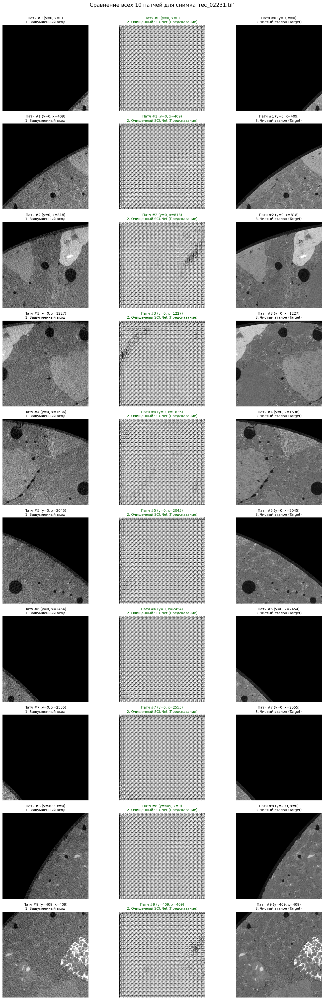

In [14]:
# Запуск для вывода патчей случайного снимка из ТЕСТОВОЙ выборки (test_dataset):
visualize_all_patches_for_random_test_image(
    model=model,
    val_dataset=test_dataset,  # 🔥 Передаем test_dataset вместо val_dataset!
    patch_size=512,
    overlap_ratio=0.2,
    max_patches_to_show=10,    # или None для всех 64 патчей
    checkpoint_path="checkpoints/scunet_best_model.pth",
    device=device
)

Используется устройство: cpu
Всего файлов по расширению: 2817


/home/jupyter/.local/lib/python3.10/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Из них валидных пар: 2816
Взято 10 файлов для демонстрации
📁 Загружено пар снимков: 10 (от rec_00000.tif до rec_00009.tif)
🎉 Сформирован индекс: 640 патчей 512x512
🔄 Стратегия аугментации: Без аугментации

Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_rate:0.000000
Block Initial Type: SW, drop_path_rate:0.000000
Block Initial Type: W, drop_path_r

/tmp/ipykernel_2674/1857561061.py:165: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/kernel/lib/python3.10/site-packages/ml_kernel/_vendor/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/kernel/lib/python3.10/site-packages/ml_kernel/_vendor/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


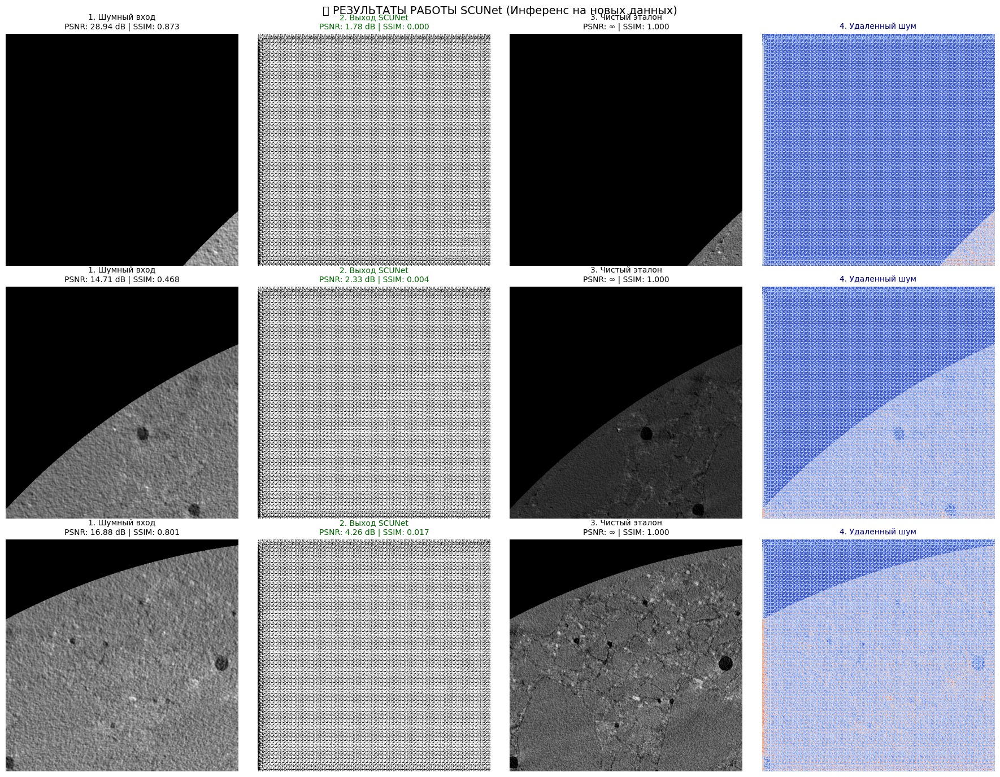

📈 ИТОГОВЫЙ ПРИРОСТ КАЧЕСТВА (Среднее по 3 образцам):
• Метрика PSNR:  было 20.17 dB ──► стало 2.79 dB (Прирост: +-17.39 dB 🚀)
• Метрика SSIM:  было 0.714    ──► стало 0.007    (Прирост: +-0.707 🚀)


In [7]:
# =============================================================================
# ТЕСТИРОВАНИЕ (INFERENCE) SCUNet — с проверкой TIFF
# =============================================================================

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import torch
import tifffile as tiff
from pathlib import Path

# --- 1. Путь к SCUNet ---
SCUNET_DIR = Path("SCUNet")
if not SCUNET_DIR.exists():
    raise FileNotFoundError("Папка SCUNet не найдена. Убедитесь, что вы клонировали репозиторий.")
if str(SCUNET_DIR.resolve()) not in sys.path:
    sys.path.insert(0, str(SCUNET_DIR.resolve()))

from models.network_scunet import SCUNet

# --- 2. Устройство ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Используется устройство: {device}")

# --- 3. Пути к данным ---
NOISY_DIR = "filestore/filestorage/V_beton30_angle05"
CLEAN_DIR = "filestore/filestorage/V_beton30_angle005"

# --- 4. Функция проверки валидности TIFF ---
def is_valid_tiff(filepath):
    try:
        with tiff.TiffFile(filepath) as tif:
            return True
    except Exception:
        return False

# --- 5. Формируем список валидных пар ---
all_files = sorted(list(set(os.listdir(NOISY_DIR)) & set(os.listdir(CLEAN_DIR))))
print(f"Всего файлов по расширению: {len(all_files)}")

valid_files = []
for f in all_files:
    noisy_path = os.path.join(NOISY_DIR, f)
    clean_path = os.path.join(CLEAN_DIR, f)
    if is_valid_tiff(noisy_path) and is_valid_tiff(clean_path):
        valid_files.append(f)

print(f"Из них валидных пар: {len(valid_files)}")

num_demo = 10  # сколько файлов взять для демонстрации
demo_files = valid_files[:num_demo]

if len(demo_files) == 0:
    raise ValueError("Нет валидных TIFF файлов в указанных директориях.")

print(f"Взято {len(demo_files)} файлов для демонстрации")

# --- 6. Создаём датасет (используем file_list) ---
demo_dataset = CTModularDataset(
    noisy_dir=NOISY_DIR,
    clean_dir=CLEAN_DIR,
    file_list=demo_files,
    patch_size=512,
    overlap_ratio=0.2,
    transform_fn=None
)

# --- 7. Инициализация модели SCUNet ---
model = SCUNet(in_nc=1, config=[4, 4, 4, 4, 4, 4, 4], dim=64).to(device)

# --- 8. Загрузка лучших весов ---
BEST_MODEL_PATH = "checkpoints/scunet_last_checkpoint.pth"
if os.path.exists(BEST_MODEL_PATH):
    state_dict = torch.load(BEST_MODEL_PATH, map_location=device)
    if 'model_state_dict' in state_dict:
        model.load_state_dict(state_dict['model_state_dict'])
        print(f"✅ Загружены веса из '{BEST_MODEL_PATH}' (эпоха {state_dict.get('epoch', '?')})")
    else:
        model.load_state_dict(state_dict)
        print(f"✅ Загружены веса из '{BEST_MODEL_PATH}' (только state_dict)")
else:
    print(f"⚠️ Файл {BEST_MODEL_PATH} не найден, используем случайную инициализацию.")

model.eval()

# --- 9. Функции метрик ---
def calculate_psnr(pred, target):
    mse = np.mean((pred - target) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * np.log10(1.0 / np.sqrt(mse))

def calculate_ssim(img1, img2):
    C1 = 0.01 ** 2
    C2 = 0.03 ** 2
    mu1 = img1.mean()
    mu2 = img2.mean()
    sigma1 = np.var(img1)
    sigma2 = np.var(img2)
    sigma12 = np.mean((img1 - mu1) * (img2 - mu2))
    ssim = ((2 * mu1 * mu2 + C1) * (2 * sigma12 + C2)) / ((mu1**2 + mu2**2 + C1) * (sigma1 + sigma2 + C2))
    return ssim

# --- 10. Выбор информативных патчей ---
selected_indices = []
for idx in range(len(demo_dataset)):
    img_idx, y, x = demo_dataset.patch_index[idx]
    clean_patch = tiff.imread(demo_dataset.clean_paths[img_idx])[y:y+512, x:x+512].astype(np.float32)
    if np.std(clean_patch) > 0.04:
        selected_indices.append(idx)
        if len(selected_indices) == 3:
            break

if len(selected_indices) < 3:
    selected_indices = [0, len(demo_dataset)//2, len(demo_dataset)-1]

# --- 11. Прогон через модель и визуализация ---
fig, axes = plt.subplots(3, 4, figsize=(18, 14))

psnr_noisy_list, psnr_pred_list = [], []
ssim_noisy_list, ssim_pred_list = [], []

for row, idx in enumerate(selected_indices):
    noisy_tensor, clean_tensor = demo_dataset[idx]
    
    with torch.no_grad():
        input_b = noisy_tensor.unsqueeze(0).to(device)
        pred_tensor = model(input_b)
    
    noisy_np = noisy_tensor.squeeze().cpu().numpy()
    pred_np = pred_tensor.squeeze().cpu().numpy()
    clean_np = clean_tensor.squeeze().cpu().numpy()
    
    pred_np = np.clip(pred_np, 0.0, 1.0)
    noise_extracted = noisy_np - pred_np
    
    psnr_noisy = calculate_psnr(noisy_np, clean_np)
    psnr_pred = calculate_psnr(pred_np, clean_np)
    ssim_noisy = calculate_ssim(noisy_np, clean_np)
    ssim_pred = calculate_ssim(pred_np, clean_np)
    
    psnr_noisy_list.append(psnr_noisy)
    psnr_pred_list.append(psnr_pred)
    ssim_noisy_list.append(ssim_noisy)
    ssim_pred_list.append(ssim_pred)
    
    axes[row, 0].imshow(noisy_np, cmap='gray', vmin=0, vmax=1)
    axes[row, 0].set_title(f"1. Шумный вход\nPSNR: {psnr_noisy:.2f} dB | SSIM: {ssim_noisy:.3f}", fontsize=10)
    axes[row, 0].axis('off')
    
    axes[row, 1].imshow(pred_np, cmap='gray', vmin=0, vmax=1)
    axes[row, 1].set_title(f"2. Выход SCUNet\nPSNR: {psnr_pred:.2f} dB | SSIM: {ssim_pred:.3f}", fontsize=10, color='darkgreen')
    axes[row, 1].axis('off')
    
    axes[row, 2].imshow(clean_np, cmap='gray', vmin=0, vmax=1)
    axes[row, 2].set_title(f"3. Чистый эталон\nPSNR: ∞ | SSIM: 1.000", fontsize=10)
    axes[row, 2].axis('off')
    
    axes[row, 3].imshow(noise_extracted, cmap='coolwarm')
    axes[row, 3].set_title("4. Удаленный шум", fontsize=10, color='darkblue')
    axes[row, 3].axis('off')

plt.suptitle("📊 РЕЗУЛЬТАТЫ РАБОТЫ SCUNet (Инференс на новых данных)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

# --- 12. Итоговый отчёт ---
print("=" * 65)
print("📈 ИТОГОВЫЙ ПРИРОСТ КАЧЕСТВА (Среднее по 3 образцам):")
print(f"• Метрика PSNR:  было {np.mean(psnr_noisy_list):.2f} dB ──► стало {np.mean(psnr_pred_list):.2f} dB (Прирост: +{np.mean(psnr_pred_list) - np.mean(psnr_noisy_list):.2f} dB 🚀)")
print(f"• Метрика SSIM:  было {np.mean(ssim_noisy_list):.3f}    ──► стало {np.mean(ssim_pred_list):.3f}    (Прирост: +{np.mean(ssim_pred_list) - np.mean(ssim_noisy_list):.3f} 🚀)")
print("=" * 65)

In [8]:
print(os.listdir('checkpoints'))

['scunet_last_checkpoint.pth', 'unet_best_model.pth', 'unet_last_checkpoint.pth']
